## Import Modules

In [1]:
import os
import time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
#import tensorflow_probability as tfp
from tensorflow.keras import layers, models

from IPython.display import clear_output
from tensorflow.keras.applications.vgg19 import VGG19
print(tf.__version__)

2.8.0


## Configs

In [2]:
########### YOUR CODE HERE ################
"""Tùy thuộc vào cách load data để cần 1 hay
nhiều path tới data ở đây mình dùng 2 nếu các 
bạn dùng ít hoặc nhiệu hơn thì có thể xóa hoặc 
khai báo thêm"""

# Path tới data folder 
PATH = '/media/aivn24/partition2/Khoa/AI2021/GAN/Project/data/data_prob2'
###########################################

BUFFER_SIZE = 20
BATCH_SIZE  = 1
IMG_WIDTH   = 1024
IMG_HEIGHT  = 256

LOW_WIDTH   = 256
LOW_HEIGHT  = 64

## Prepare Data

In [3]:
def load(image_path):
    
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image)
    half_w = tf.shape(image)[1]//2
    left_image = image[:, 0:half_w, :]
    right_image = image[:, half_w:, :]
    
    left_image_lr = tf.image.resize(left_image, size=(LOW_HEIGHT, LOW_WIDTH))
    left_target_lr = tf.image.resize(left_image, size=(LOW_HEIGHT, LOW_WIDTH))
    
    right_image_lr = tf.image.resize(right_image, size=(LOW_HEIGHT, LOW_WIDTH))
    right_target_lr = tf.image.resize(right_image, size=(LOW_HEIGHT, LOW_WIDTH))
    
    left_target_hr = tf.image.resize(left_image, size=(IMG_HEIGHT, IMG_WIDTH))
    right_target_hr = tf.image.resize(right_image, size=(IMG_HEIGHT, IMG_WIDTH))
    
    
    left_image_lr = tf.cast(left_image_lr, dtype=tf.float32)
    left_target_lr = tf.cast(left_target_lr, dtype=tf.float32)
    
    right_image_lr = tf.cast(right_image_lr, dtype=tf.float32)
    right_target_lr = tf.cast(right_target_lr, dtype=tf.float32)
    
    left_target_hr = tf.cast(left_target_hr, dtype=tf.float32)
    right_target_hr = tf.cast(right_target_hr, dtype=tf.float32)
    
    
    noise_per = 0.20
    left_noise = tf.random.uniform(shape=(LOW_HEIGHT,LOW_WIDTH,3), minval=1-noise_per, maxval=1+noise_per)
    right_noise = tf.random.uniform(shape=(LOW_HEIGHT,LOW_WIDTH,3), minval=1-noise_per, maxval=1+noise_per)
    
    left_image_lr = left_image_lr*left_noise
    left_image_lr = tf.clip_by_value(left_image_lr, 0, 255)
    
    right_image_lr = right_image_lr*right_noise
    right_image_lr = tf.clip_by_value(right_image_lr, 0, 255)
    
    
    
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr


(64, 256, 3)
(64, 256, 3)
(64, 256, 3)
(64, 256, 3)
(256, 1024, 3)
(256, 1024, 3)


2022-04-02 16:36:14.830607: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-02 16:36:14.848908: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-02 16:36:14.849940: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-02 16:36:14.851462: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

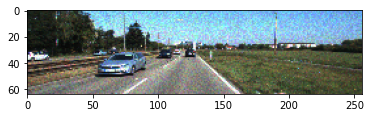

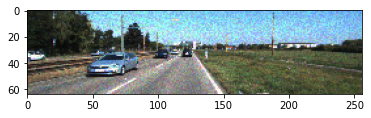

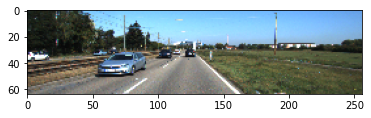

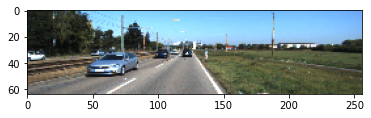

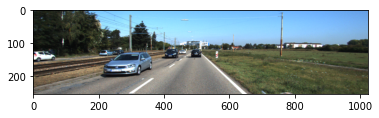

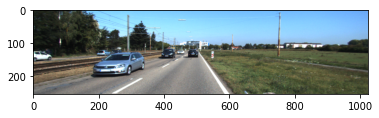

In [4]:
left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = load(PATH+'/train/000041_10.png')
print(left_image_lr.shape)
print(right_image_lr.shape)
print(left_target_lr.shape)
print(right_target_lr.shape)
print(left_target_hr.shape)
print(right_target_hr.shape)


# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(left_image_lr/255.0)
plt.figure()
plt.imshow(right_image_lr/255.0)
plt.figure()
plt.imshow(left_target_lr/255.0)
plt.figure()
plt.imshow(right_target_lr/255.0)
plt.figure()
plt.imshow(left_target_hr/255.0)
plt.figure()
plt.imshow(right_target_hr/255.0)

In [5]:
def normalize(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    normalizing the images to [-1, 1]    
    Parameters
    ----------
    image_lr     : tf.Tensor (tf.float32) 
        ảnh input low resolution và nhiễu
    target_lr     : tf.Tensor (tf.float32) 
        ảnh target low resolution  
    target_hr    : tf.Tensor (tf.float32) 
        ảnh target high resolution 
    
    Returns
    -------
    image_lr     : tf.Tensor (tf.float32) 
        ảnh input low resolution và nhiễu
    target_lr     : tf.Tensor (tf.float32) 
        ảnh target low resolution  
    target_hr    : tf.Tensor (tf.float32) 
        ảnh target high resolution 
    """
    left_image_lr  = (left_image_lr/127.5) - 1  
    right_image_lr = (right_image_lr/127.5) - 1 
    left_target_lr = (left_target_lr/127.5) - 1 
    right_target_lr  = (right_target_lr/127.5) - 1  
    left_target_hr = (left_target_hr/127.5) - 1 
    right_target_hr = (right_target_hr/127.5) - 1 
    
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr
    ###########################################

#@tf.function()
def random_jitter(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr):
    if tf.random.uniform(()) > 0.5:
        # random mirroring
        left_image_lr  = tf.image.flip_left_right(left_image_lr)
        right_image_lr  = tf.image.flip_left_right(right_image_lr)
        left_target_lr  = tf.image.flip_left_right(left_target_lr)
        right_target_lr  = tf.image.flip_left_right(right_target_lr)
        left_target_hr  = tf.image.flip_left_right(left_target_hr)
        right_target_hr  = tf.image.flip_left_right(right_target_hr)
        
    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr
    

def load_image_train(image_path):
    # load ảnh 
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = load(image_path)

    # random jiter 
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = random_jitter(left_image_lr, 
                                                                                                                    right_image_lr, 
                                                                                                                    left_target_lr, 
                                                                                                                    right_target_lr, 
                                                                                                                    left_target_hr, 
                                                                                                                    right_target_hr)

    # normalize ảnh
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = normalize(left_image_lr, 
                                                                                                               right_image_lr, 
                                                                                                               left_target_lr, 
                                                                                                               right_target_lr, 
                                                                                                               left_target_hr, 
                                                                                                               right_target_hr)

    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr 



def load_image_test(image_path):
    # load ảnh 
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = load(image_path)

    # normalize ảnh
    left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr = normalize(left_image_lr, 
                                                                                                               right_image_lr, 
                                                                                                               left_target_lr, 
                                                                                                               right_target_lr, 
                                                                                                               left_target_hr, 
                                                                                                               right_target_hr)

    return left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr 
    


In [6]:
# train_dataset
########### YOUR CODE HERE ################
#thay đổi đường dẫn phù hợp
train_dataset = tf.data.Dataset.list_files(PATH+'/train/*.png')
###########################################
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(1)

# test_dataset
########### YOUR CODE HERE ################
#thay đổi đường dẫn phù hợp
test_dataset = tf.data.Dataset.list_files(PATH+'/val/*.png')
###########################################
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(1)

(1, 64, 256, 3)
(1, 64, 256, 3)
(1, 64, 256, 3)
(1, 64, 256, 3)
(1, 256, 1024, 3)
(1, 256, 1024, 3)


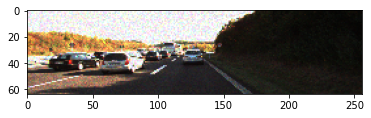

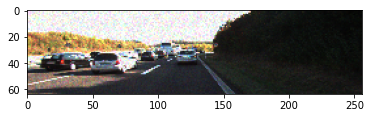

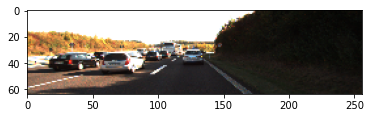

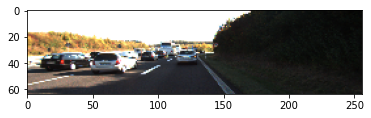

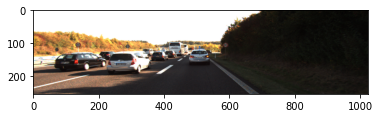

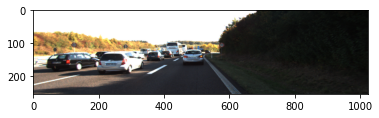

In [7]:
for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr in train_dataset.take(1):
    print(left_image_lr.shape)
    print(right_image_lr.shape)
    print(left_target_lr.shape)
    print(right_target_lr.shape)
    print(left_target_hr.shape)
    print(right_target_hr.shape)

    # casting to int for matplotlib to show the image
    plt.figure()
    plt.imshow(left_image_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(right_image_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(left_target_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(right_target_lr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(left_target_hr[0]*0.5 +0.5)
    plt.figure()
    plt.imshow(right_target_hr[0]*0.5 +0.5)
    break

## Build Model

### Blocks

In [8]:
def extract_first_features(filters, size, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Extract feature của input images CONV2D -> BN(bool) -> LeakyRelu
    padding = same, stride = 1
    Parameters
    ----------
    filters         : int
        số lượng filters
    size            : int
        size của filter
    apply_batchnorm : bool
        có sử dụng batchnorm hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        block CONV2D -> BN(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    # Conv2D stride=1
    result.add(layers.Conv2D(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=1, padding='same', use_bias=False))
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################
    
    
def downsample(filters, size, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    downsample trong Unet CONV2D -> BN(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        số lượng filters
    size            : int
        size của filter
    apply_batchnorm : bool
        có sử dụng batchnorm hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        block CONV2D -> BN(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    # Conv2D stride=2
    result.add(layers.Conv2D(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=2, padding='same', use_bias=False))
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################
    


def downsample_dis(filters, size_12, size_3, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    downsample dành cho discriminator trong Unet CONV2D -> CONV2D -> CONV2D -> BN(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        số lượng filters
    size_12         : int
        kernel size cho CONV2D 1 và 2
    size_3          : int
        kernel size cho CONV2D 3
    apply_batchnorm : bool
        có sử dụng batchnorm hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        CONV2D -> CONV2D -> CONV2D -> BN(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer1 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer2 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer3 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    # Conv2D stride=1 kernel_size=size_12
    result.add(layers.Conv2D(filters=filters, kernel_size=size_12, kernel_initializer=initializer1,
                             strides=1, padding='same', use_bias=False))
    
    # Conv2D stride=1 kernel_size=size_12
    result.add(layers.Conv2D(filters=filters, kernel_size=size_12, kernel_initializer=initializer2,
                             strides=1, padding='same', use_bias=False))
    # Conv2D stride=2 kernel_size=size_3
    result.add(layers.Conv2D(filters=filters, kernel_size=size_23, kernel_initializer=initializer3,
                             strides=2, padding='same', use_bias=False))
    
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################
    

def upsample(filters, size, apply_dropout=False):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    upsample trong Unet Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        path nơi chứa ảnh data (4 ảnh nhỏ để split)
    size            : int
        kernel size
    apply_dropout : bool
        có sử dụng Dropout hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)

    # Conv2DTranspose stride=2
    result.add(layers.Conv2DTranspose(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=2, padding='same', use_bias=False))
    
    # BatchNorm
    result.add(layers.BatchNormalization())
    
    # check apply_dropout nếu True thì dùng 
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    # Relu 
    result.add(layers.ReLU())
    
    return result
    ###########################################

def downsample_sr(filters, size, apply_batchnorm=True):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    downsample cho super resolution Conv2D -> BN(bool) -> LeakyRelu 
    padding = same, stride = 1
    Parameters
    ----------
    filters         : int
        path nơi chứa ảnh data (4 ảnh nhỏ để split)
    size            : int
        kernel size
    apply_batchnorm : bool
        có sử dụng Dropout hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        Conv2D -> BN -> Dropout(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    # Conv2D stride=1
    result.add(layers.Conv2D(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=1, padding='same', use_bias=False))
    
    # check apply_batchnorm nếu True thì dùng 
    if apply_batchnorm:
        result.add(layers.BatchNormalization())
    
    # leakyRelu 
    result.add(layers.LeakyReLU())
    return result
    ###########################################

def upsample_sr(filters, size, apply_dropout=False):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    upsample trong super resolution Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    Parameters
    ----------
    filters         : int
        path nơi chứa ảnh data (4 ảnh nhỏ để split)
    size            : int
        kernel size
    apply_dropout : bool
        có sử dụng Dropout hay không 
    Returns
    -------
    result: (tùy thuộc vd Sequential)
        Conv2DTranspose -> BN -> Dropout(bool) -> LeakyRelu
    """
    result = tf.keras.Sequential()
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)

    # Conv2DTranspose stride=2
    result.add(layers.Conv2DTranspose(filters=filters, kernel_size=size, kernel_initializer=initializer,
                             strides=2, padding='same', use_bias=False))
    
    # BatchNorm
    result.add(layers.BatchNormalization())
    
    # check apply_dropout nếu True thì dùng 
    if apply_dropout:
        result.add(layers.Dropout(0.5))
    # leakyRelu 
    result.add(layers.LeakyReLU())
    
    return result
    ###########################################

### Generator

In [9]:
def UNet_process(x):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Thực hiện theo kiến trúc Unet như Generator trong hình yêu cầu 
    để loại nhiễu khỏi ảnh (Code tương tự như link hướng dẫn của tensorflow)
    Parameters
    ----------
    x         : tensor 
        feature ảnh input
    Returns
    -------
    x: tensor
        ảnh xóa nhiễu
    """
    # (Code tương tự như link hướng dẫn của tensorflow)
    
    # tạo down_stack (encoder) gồm các downsample
    # mỗi step sẽ giảm size đi 2 lần 
    # số lượng filters mỗi step [64,256,512,512,512] qua 5 lần size sẽ giảm là 32 lần
    # kernel_size=4
    down_stack = [
        downsample(filters=64, size=4, apply_batchnorm=False),
        downsample(filters=256, size=4, apply_batchnorm=True),
        downsample(filters=512, size=4, apply_batchnorm=True),
        downsample(filters=512, size=4, apply_batchnorm=True),
        downsample(filters=512, size=4, apply_batchnorm=True),
    ]

    # tạo up_stack (decoder) gồm các upsample
    # mỗi step sẽ giảm size tăng lên 2 lần và số lượng filters tăng 2
    # số lượng filters mỗi step  [512,512,256,64] qua 5 lần size sẽ giảm là 32 lần
    # kernel_size=4
    up_stack = [
        upsample(filters=512, size=4, apply_dropout=True),
        upsample(filters=512, size=4, apply_dropout=True),
        upsample(filters=256, size=4, apply_dropout=True),
        upsample(filters=64, size=4, apply_dropout=False),
    ]

    # tạo last layer nhân 2 lần kích thước feature với Conv2DTranspose(), channel=3 cho output ảnh 
    # đã xóa nhiễu (chọn activation phù hợp)
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    last = layers.Conv2DTranspose(filters=6, kernel_size=4, kernel_initializer=initializer,
                             strides=2, padding='same', activation='tanh')
                
    
    # Downsampling through the model (Code tương tự như link hướng dẫn của tensorflow)
    # thực vòng lập để chạy x cho mỗi layer trong down_stack
    # đồng thời đưa kết quả mỗi layer vào list (để dùng cho skip connection)
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    # reverse skip connection list loại bỏ layer cuối (bridge không dùng skip connection)
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections (Code tương tự như link hướng dẫn của tensorflow)
    # upsamling và concatenate với level tương ứng (element trong list skip connection)
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    # đi vào layer last đã tạo ở trên để ra ảnh có kích thước bằng ảnh input và đã xóa nhiễu
    x = last(x)
    
    return x
    ###########################################
        
    
def Generator(): 
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Thực hiện toàn bộ task của model tạo ảnh xóa nhiễu sau đó tạo ảnh 
    supre resolution (x4 size)
    
    -------
    model: tf.keras.models.Model
        model tạo ảnh xóa nhiễu và ảnh super resolution 
    """

    # tạo layer input với shape = input low resolution image (có nhiễu)
    l_inp = layers.Input(shape=(LOW_HEIGHT, LOW_WIDTH, 3))
    r_inp = layers.Input(shape=(LOW_HEIGHT, LOW_WIDTH, 3))
    
    
    
    # extract_first_features, filters=16, kernel_size  = 3
    # Các bạn có thể lựa chọn thêm các thành phần khác để cải thiện model 
    l_x = extract_first_features(filters=64, size=3, apply_batchnorm=True)(l_inp)
    r_x = extract_first_features(filters=64, size=3, apply_batchnorm=True)(r_inp)
    x = layers.Concatenate()([l_x, r_x])
    
    # Đi vào UNet_process để denoise thu được fake_lr
    x = UNet_process(x)
    fake_lr = x

    # rẻ nhánh và đi tiếp vào extract_first_features filters = 64, kernel_size = 3
    x_l = extract_first_features(filters=64, size=3, apply_batchnorm=True)(x[..., 0:3])
    x_r = extract_first_features(filters=64, size=3, apply_batchnorm=True)(x[..., 3:])
    x = layers.Concatenate()([x_l, x_r])
    
    # thực hiện downsample_sr filters = 256, kernel_size = 3
    x = downsample_sr(filters=256, size=3, apply_batchnorm=True)(x)
    
    # thực hiện downsample_sr filters = 256, kernel_size = 3
    x = downsample_sr(filters=256, size=3, apply_batchnorm=True)(x)
    
    # thực hiện upsample_sr filters = 128, kernel_size = 4
    x = upsample_sr(filters=128, size=4, apply_dropout=False)(x)
    
    # thực hiện downsample_sr filters = 128, kernel_size = 3
    x = downsample_sr(filters=128, size=3, apply_batchnorm=True)(x)
    
    # tạo layer last Conv2DTranspose filters = 6, kernel_size = 4, strides=2  (tạo ảnh high resolution) 
    # qua layer last để lấy fake_hr (chọn activation phù hợp)
    initializer =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    last = layers.Conv2DTranspose(filters=6, kernel_size=4, kernel_initializer=initializer,
                             strides=2, padding='same', activation='tanh')
    
    fake_hr = last(x)
    
    # tạo model là inputs=input layer ở trên và outputs=[fake_lr, fake_hr]
    model = models.Model(inputs=[l_inp, r_inp], outputs=[fake_lr, fake_hr])
    
    return model
    ###########################################

In [10]:
generator = Generator()
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 input_2 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 sequential (Sequential)        (None, 64, 256, 64)  1984        ['input_1[0][0]']                
                                                                                              

### Discriminator

In [11]:
def Discriminator1():
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Discrminator 1 dùng cho phân biệt ảnh low resolution 
    
    -------
    model: tf.keras.models.Model
        model phân loại ảnh sau khi xóa nhiễu của model và ảnh targe_lr có giống nhau hay không 
        generator có đánh lừa được discriminator
    """
    # các bạn tham khảo link sau 
    # https://www.tensorflow.org/tutorials/generative/pix2pix#build_the_discriminator
    # phần này khá đơn giản nó hoạt động giống như 1 mạng classification bình thường đã được học 
    # các bạn có thể tùy ý thêm ý tưởng ở đây.
    inp = tf.keras.layers.Input(shape=[LOW_HEIGHT, LOW_WIDTH, 3])
    tar = tf.keras.layers.Input(shape=[LOW_HEIGHT, LOW_WIDTH, 3])
    x = tf.keras.layers.concatenate([inp, tar])
    
    x = downsample(filters=64,  size=4, apply_batchnorm=False)(x)
    x = downsample(filters=128, size=4, apply_batchnorm=True)(x)
    x = downsample(filters=256, size=4, apply_batchnorm=True)(x)
    
    initializer1 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer2 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    x = layers.Conv2D(filters=256, kernel_size=3, kernel_initializer=initializer1,
                             strides=1, use_bias=False)(x)
    x = layers.Conv2D(filters=1, kernel_size=3, kernel_initializer=initializer2,
                             strides=1, use_bias=False)(x)
    
    model = models.Model(inputs=[inp,tar], outputs=x)
    
    return model
    #########################################################
    
def Discriminator2():
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    Discrminator 2 dùng cho phân biệt ảnh high resolution 
    
    -------
    model: tf.keras.models.Model
        model phân loại ảnh sau khi model thực hiện tạo ra ảnh super resolution và ảnh targe_lr có giống nhau hay không 
        generator có đánh lừa được discriminator2
    """
    # các bạn tham khảo link sau 
    # https://www.tensorflow.org/tutorials/generative/pix2pix#build_the_discriminator
    # phần này khá đơn giản nó hoạt động giống như 1 mạng classification bình thường đã được học 
    # các bạn có thể tùy ý thêm ý tưởng ở đây.
    inp = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_WIDTH, 3])
    
    x = downsample(filters=64,  size=4, apply_batchnorm=False)(inp)
    x = downsample(filters=128, size=4, apply_batchnorm=True)(x)
    x = downsample(filters=256, size=4, apply_batchnorm=True)(x)
    
    initializer1 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    initializer2 =  tf.keras.initializers.RandomNormal(mean=0. , stddev=0.02)
    
    x = layers.Conv2D(filters=256, kernel_size=3, kernel_initializer=initializer1,
                             strides=1, use_bias=False)(x)
    x = layers.Conv2D(filters=1, kernel_size=3, kernel_initializer=initializer2,
                             strides=1, use_bias=False)(x)
    
    model = models.Model(inputs=inp, outputs=x)
    return model
    #########################################################

In [12]:
discriminator1 = Discriminator1()
discriminator2 = Discriminator2()

In [13]:
discriminator1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 input_4 (InputLayer)           [(None, 64, 256, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 concatenate_6 (Concatenate)    (None, 64, 256, 6)   0           ['input_3[0][0]',                
                                                                  'input_4[0][0]']          

In [14]:
discriminator2.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 1024, 3)]    0         
                                                                 
 sequential_20 (Sequential)  (None, 128, 512, 64)      3072      
                                                                 
 sequential_21 (Sequential)  (None, 64, 256, 128)      131584    
                                                                 
 sequential_22 (Sequential)  (None, 32, 128, 256)      525312    
                                                                 
 conv2d_20 (Conv2D)          (None, 30, 126, 256)      589824    
                                                                 
 conv2d_21 (Conv2D)          (None, 28, 124, 1)        2304      
                                                                 
Total params: 1,252,096
Trainable params: 1,251,328
Non-tra

In [15]:
img1 = tf.random.normal((1, IMG_HEIGHT//4, IMG_WIDTH//4, 3))
img2 = tf.random.normal((1, IMG_HEIGHT, IMG_WIDTH, 3))

output1_d = discriminator1([img1,img1])
print(output1_d.shape)

output2_d = discriminator2(img2)
print(output2_d.shape)

2022-04-02 16:36:16.994186: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8100


(1, 4, 28, 1)
(1, 28, 124, 1)


## Compile & Train

### Loss

#### Discriminator Loss

In [16]:
# Khai báo BCE loss
loss_dsic_object = tf.keras.losses.BinaryCrossentropy(from_logits=True, label_smoothing=0.03)
def discriminator_loss(left_disc_real_output, right_disc_real_output, left_disc_generated_output, right_disc_generated_output):
    # dùng loss_dsic_object tính loss disc_real_output với ma trận ones cùng size disc_real_output
    left_real_los = loss_dsic_object(tf.ones_like(left_disc_real_output), left_disc_real_output)
    right_real_los = loss_dsic_object(tf.ones_like(right_disc_real_output), right_disc_real_output)
    
    # dùng loss_dsic_object tính loss disc_generated_output với ma trận zeros cùng size disc_generated_output
    left_fake_los = loss_dsic_object(tf.zeros_like(left_disc_generated_output), left_disc_generated_output)
    right_fake_los = loss_dsic_object(tf.zeros_like(right_disc_generated_output), right_disc_generated_output)
    
    # total_loss = tổng 2 loss trên
    total_loss = left_real_los + right_real_los + left_fake_los + right_fake_los
    
    return total_loss
    #########################################################


#### Generator Loss

In [17]:
# các bạn chọn weight cho loss
LAMBDA = 40
################################

loss_gener1_object  = tf.keras.losses.BinaryCrossentropy(from_logits=True)
loss_gener2_object  = tf.keras.losses.BinaryCrossentropy(from_logits=True)


def generator_loss1(left_disc_lr_generated_output, right_disc_lr_generated_output, gen_output, left_target_lr, right_target_lr):
    left_gan_loss = loss_gener1_object(tf.ones_like(left_disc_lr_generated_output), left_disc_lr_generated_output)
    right_gan_loss = loss_gener1_object(tf.ones_like(right_disc_lr_generated_output), right_disc_lr_generated_output)
    gan_loss = left_gan_loss + right_gan_loss
    
    left_l1_loss = tf.reduce_mean(tf.abs(left_target_lr - gen_output[...,0:3]))
    left_l1_loss = LAMBDA*left_l1_loss
    right_l1_loss = tf.reduce_mean(tf.abs(right_target_lr - gen_output[...,3:6]))
    right_l1_loss = LAMBDA*right_l1_loss
    l1_loss = left_l1_loss + right_l1_loss
    
    total_loss = gan_loss + l1_loss

    return total_loss, gan_loss, l1_loss
    



def generator_loss2(left_disc_hr_generated_output, right_disc_hr_generated_output, gen_output, left_target_hr, right_target_hr):
    left_gan_loss = loss_gener1_object(tf.ones_like(left_disc_hr_generated_output), left_disc_hr_generated_output)
    right_gan_loss = loss_gener1_object(tf.ones_like(right_disc_hr_generated_output), right_disc_hr_generated_output)
    gan_loss = left_gan_loss + right_gan_loss
    
    left_l1_loss = tf.reduce_mean(tf.abs(left_target_hr - gen_output[...,0:3]))
    left_l1_loss = LAMBDA*left_l1_loss
    right_l1_loss = tf.reduce_mean(tf.abs(right_target_hr - gen_output[...,3:6]))
    right_l1_loss = LAMBDA*right_l1_loss
    l1_loss = left_l1_loss + right_l1_loss
    
    total_loss = gan_loss + l1_loss

    return total_loss, gan_loss, l1_loss




#### Optimizers

In [18]:
# các bạn tùy chọn đây là mẫu
generator_optimizer     = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator1_optimizer = tf.keras.optimizers.Adam(7e-3, beta_1=0.5)
discriminator2_optimizer = tf.keras.optimizers.Adam(7e-3, beta_1=0.5)

#### Config Checkpoint

In [19]:
checkpoint_dir = 'checkpoints2'
# chọn đường dẫn lưu checkpoints
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator1_optimizer=discriminator1_optimizer,
                                 discriminator2_optimizer=discriminator2_optimizer,
                                 generator=generator,
                                 discriminator1=discriminator1,
                                 discriminator2=discriminator2)

#### Evaluation and Show Result Functions

In [20]:
# phần này các bạn nên chỉnh sửa cho phù hợp với model output của mình
def evaluate(model, epoch):        
    psnr_mean = 0.0
    for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr in test_dataset:
        _, fake_hr = model([left_image_lr, right_image_lr], training=False)
        fake_l, fake_r = fake_hr[:,:,:,0:3], fake_hr[:,:,:,3:6]
        psnr_l = tf.image.psnr(fake_l, left_target_hr, max_val=1.0)
        psnr_r = tf.image.psnr(fake_r, right_target_hr, max_val=1.0)

        psnr_mean_l = tf.math.reduce_mean(psnr_l)
        psnr_mean_r = tf.math.reduce_mean(psnr_r)
        psnr_mean_b = (psnr_mean_l + psnr_mean_r) / 2.0
        
        psnr_mean = psnr_mean + psnr_mean_b
    
#     psnr_mean = psnr_mean/10.0
    print('-------- psnr: ', psnr_mean.numpy(), '   ----- epoch: ', epoch)
    return psnr_mean

def generate_images(model, left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr, is_fake_lr=False):
    fake_lr, fake_hr = model([left_image_lr, right_image_lr], training=False)
    if is_fake_lr:
        display_list = [left_image_lr[0], fake_lr[0, ..., 0:3], left_target_hr[0], fake_hr[0, ..., 0:3]]
        title_l = ['L_Input', 'L_Denoise', 'L_Real', 'L_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(4):
            plt.subplot(1, 4, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.show()
        
        display_list = [right_image_lr[0], fake_lr[0, ..., 3:], right_target_hr[0], fake_hr[0, ..., 3:]]
        title_l = ['R_Input', 'R_Denoise', 'R_Real', 'R_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(4):
            plt.subplot(1, 4, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.show()
            
    else:
        display_list = [left_image_lr[0], left_target_hr[0], fake_hr[0, ..., 0:3]]
        title_l = ['L_Input', 'L_Real', 'L_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
#         plt.axis('off')
        plt.show()
        
        display_list = [right_image_lr[0], right_target_hr[0], fake_hr[0, ..., 3:]]
        title_l = ['R_Input', 'R_Real', 'R_Generated']    
        plt.figure(figsize=(25,30))
        for i in range(3):
            plt.subplot(1, 3, i+1)
            plt.title(title_l[i])
            plt.imshow(display_list[i] * 0.5 + 0.5)
#         plt.axis('off')
        plt.show()

#### Train Function

In [21]:
@tf.function
def train_step(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr):
    ########### YOUR CODE HERE (OPTIONAL) ################
    """ ĐÂY LÀ ĐOẠN CODE OPTIONAL KHÔNG BẮT BUỘC PHẢI THỰC HIỆN 
    THEO FORMAT, NẾU CÓ CÁCH KHÁC CÁC BẠN CÓ THỂ CODE THEO Ý MÌNH 
    tính loss cho generator cho phần super resolution 
    Parameters
    ----------
    image_lr         : tf.float32 
        Ảnh low resolution và nhiễu
    target_lr        : tf.float32 
        target low resolution 
    target_hr        : tf.float32 
        Ảnh targe high resolution
    -------
    gan_loss: tf.float32
        loss tổng của generator loss
    l1_loss: tf.float32
        loss gan phần super resolution
    disc_loss: tổng discriminator loss 
    
    """
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc1_tape, tf.GradientTape() as disc2_tape:
        fake_lr, fake_hr = generator([left_image_lr, right_image_lr], training=True)
        
        # discriminator1
        left_disc_lr_real_output = discriminator1([left_image_lr,left_target_lr], training=True)
        left_disc_lr_generated_output = discriminator1([left_image_lr, fake_lr[..., 0:3]], training=True)
        right_disc_lr_real_output = discriminator1([right_image_lr,right_target_lr], training=True)
        right_disc_lr_generated_output = discriminator1([right_image_lr, fake_lr[..., 3:6]], training=True)
        
        # discriminator2
        left_disc_hr_real_output = discriminator2(left_target_hr, training=True)
        left_disc_hr_generated_output = discriminator2(fake_hr[..., 0:3], training=True)
        right_disc_hr_real_output = discriminator2(right_target_hr, training=True)
        right_disc_hr_generated_output = discriminator2(fake_hr[..., 3:6], training=True)
        
        # generator_loss1
        total_lr_loss, gan_lr_loss, l1_lr_loss = generator_loss1(left_disc_lr_generated_output, right_disc_lr_generated_output, fake_lr, left_target_lr, right_target_lr)
        
        # generator_loss2
        total_hr_loss, gan_hr_loss, l1_hr_loss = generator_loss2(left_disc_hr_generated_output, right_disc_hr_generated_output, fake_hr, left_target_hr, right_target_hr)
        
        # discriminator_loss
        disc_lr_loss = discriminator_loss(left_disc_lr_real_output, right_disc_lr_real_output, left_disc_lr_generated_output, right_disc_lr_generated_output)
        
        # lấy disc_hr_loss, discriminator_loss
        disc_hr_loss = discriminator_loss(left_disc_hr_real_output, right_disc_hr_real_output, left_disc_hr_generated_output, right_disc_hr_generated_output)
        
        # tính gan_loss, l1_loss, disc_loss là tổng các loss liên quan 
        # vd gan_loss = gan_lr_loss + gan_hr_loss
        gan_loss = gan_lr_loss + gan_hr_loss
        l1_loss = l1_lr_loss + l1_hr_loss
        disc_loss = disc_lr_loss + disc_hr_loss
        
        total_gen_loss = total_lr_loss + total_hr_loss
    # tính gradient cho các model tương ứng generator-gen_tape
    # disc1_tape-discriminator1, disc2_tape-discriminator2
    gen_gradients = gen_tape.gradient(total_gen_loss, generator.trainable_variables)
    disc1_gradients = disc1_tape.gradient(disc_lr_loss, discriminator1.trainable_variables)
    disc2_gradients = disc2_tape.gradient(disc_hr_loss, discriminator2.trainable_variables)
    
    # apply graident cho các model tương tự như trên 
    generator_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    discriminator1_optimizer.apply_gradients(zip(disc1_gradients, discriminator1.trainable_variables))
    discriminator2_optimizer.apply_gradients(zip(disc2_gradients, discriminator2.trainable_variables))
    
    return gan_loss, l1_loss, disc_loss
    #########################################################
    

    

    
    
def fit(train_ds, epochs, test_ds):
    best_psnr = 0.0
    for epoch in range(epochs):
        start = time.time()        

        # Train
        for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr in train_ds:            
#             
            gan_loss, l1_loss, disc_loss = train_step(left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr)
        
        psnr = evaluate(generator, epoch)        
        if best_psnr < psnr:
            checkpoint.save(file_prefix = checkpoint_prefix)
            best_psnr = psnr
            
            for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr in test_ds.take(1):
                generate_images(generator, left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr)

        
        print('epoch {}  gan_loss: {}  l1_loss: {}  disc_loss: {}'.format(epoch, gan_loss, l1_loss, disc_loss))


#### Train

-------- psnr:  43.77314    ----- epoch:  0


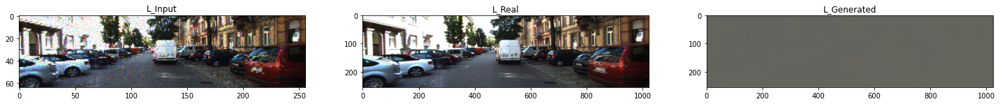

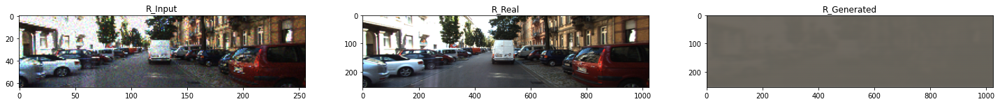

epoch 0  gan_loss: 70.66881561279297  l1_loss: 53.523616790771484  disc_loss: 582.5420532226562
-------- psnr:  50.660442    ----- epoch:  1


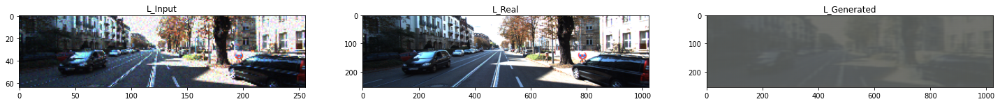

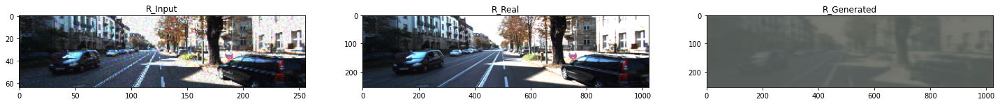

epoch 1  gan_loss: 3.2561957836151123  l1_loss: 22.729537963867188  disc_loss: 5.5182976722717285
-------- psnr:  79.08671    ----- epoch:  2


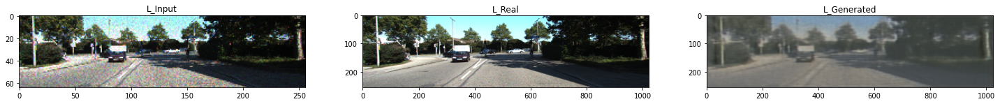

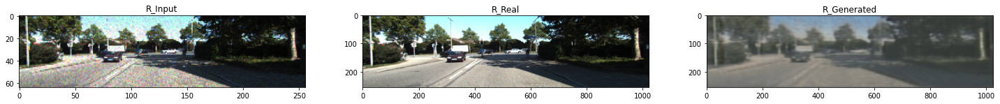

epoch 2  gan_loss: 2.9251370429992676  l1_loss: 16.87611198425293  disc_loss: 5.621285438537598
-------- psnr:  134.08455    ----- epoch:  3


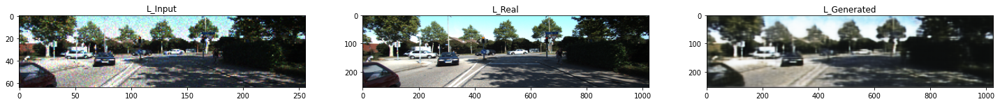

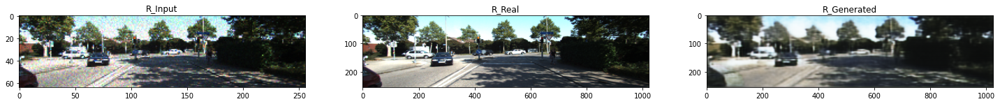

epoch 3  gan_loss: 2.721371650695801  l1_loss: 22.068944931030273  disc_loss: 5.585744380950928
-------- psnr:  128.56165    ----- epoch:  4
epoch 4  gan_loss: 2.5532784461975098  l1_loss: 15.398820877075195  disc_loss: 5.719568729400635
-------- psnr:  136.02666    ----- epoch:  5


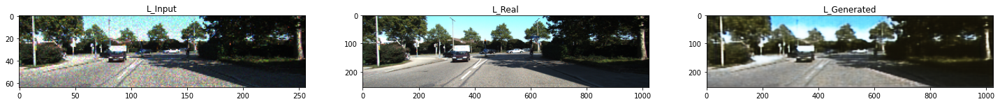

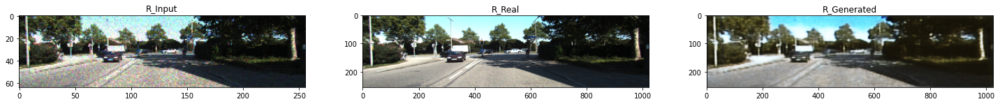

epoch 5  gan_loss: 2.818854331970215  l1_loss: 17.87645721435547  disc_loss: 5.5567731857299805
-------- psnr:  130.69495    ----- epoch:  6
epoch 6  gan_loss: 2.7479233741760254  l1_loss: 26.600318908691406  disc_loss: 5.4987874031066895
-------- psnr:  128.56883    ----- epoch:  7
epoch 7  gan_loss: 2.849003314971924  l1_loss: 18.98517417907715  disc_loss: 5.52655029296875
-------- psnr:  96.619606    ----- epoch:  8
epoch 8  gan_loss: 2.8811328411102295  l1_loss: 16.551748275756836  disc_loss: 5.546690464019775
-------- psnr:  139.17838    ----- epoch:  9


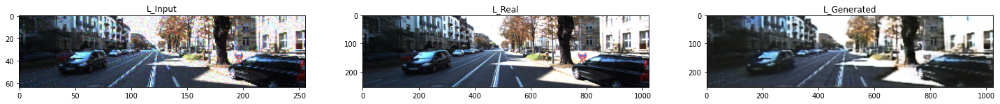

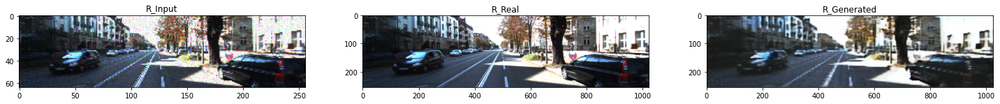

epoch 9  gan_loss: 2.7118167877197266  l1_loss: 19.892187118530273  disc_loss: 5.543403625488281
-------- psnr:  139.6195    ----- epoch:  10


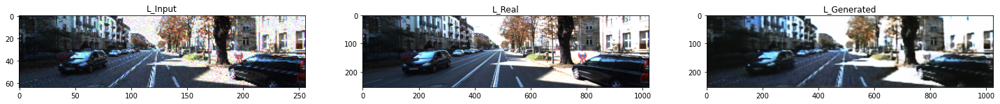

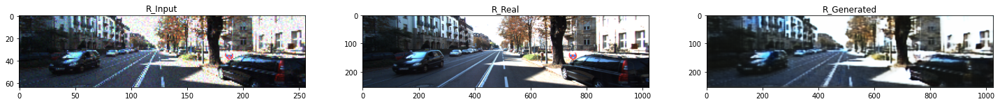

epoch 10  gan_loss: 2.744917392730713  l1_loss: 13.935284614562988  disc_loss: 5.549072265625
-------- psnr:  143.40015    ----- epoch:  11


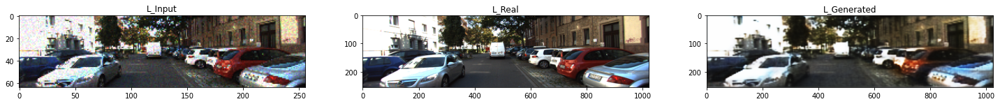

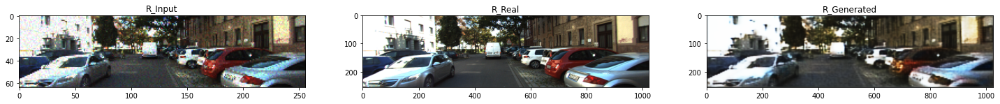

epoch 11  gan_loss: 2.8129689693450928  l1_loss: 17.28160285949707  disc_loss: 5.553309440612793
-------- psnr:  138.46933    ----- epoch:  12
epoch 12  gan_loss: 2.75734806060791  l1_loss: 16.453407287597656  disc_loss: 5.524628162384033
-------- psnr:  139.48924    ----- epoch:  13
epoch 13  gan_loss: 2.808396816253662  l1_loss: 18.270536422729492  disc_loss: 5.5398359298706055
-------- psnr:  122.89068    ----- epoch:  14
epoch 14  gan_loss: 2.9866602420806885  l1_loss: 26.958642959594727  disc_loss: 5.902245044708252
-------- psnr:  139.60468    ----- epoch:  15
epoch 15  gan_loss: 2.7917308807373047  l1_loss: 14.442877769470215  disc_loss: 5.5771331787109375
-------- psnr:  130.05193    ----- epoch:  16
epoch 16  gan_loss: 2.8442647457122803  l1_loss: 11.314407348632812  disc_loss: 5.55349588394165
-------- psnr:  132.65419    ----- epoch:  17
epoch 17  gan_loss: 2.820812463760376  l1_loss: 16.335540771484375  disc_loss: 5.523981094360352
-------- psnr:  111.21777    ----- epoch: 

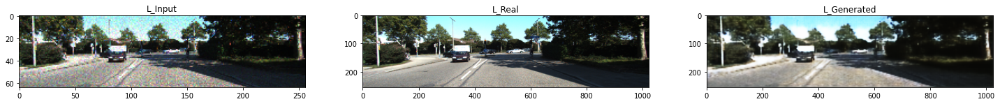

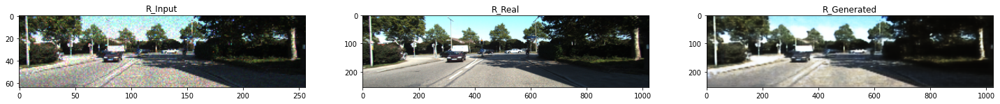

epoch 24  gan_loss: 2.739898920059204  l1_loss: 12.378599166870117  disc_loss: 5.5455474853515625
-------- psnr:  136.87614    ----- epoch:  25
epoch 25  gan_loss: 2.784919500350952  l1_loss: 19.060062408447266  disc_loss: 5.509610652923584
-------- psnr:  136.99353    ----- epoch:  26
epoch 26  gan_loss: 2.9133591651916504  l1_loss: 20.849061965942383  disc_loss: 5.573750972747803
-------- psnr:  144.0459    ----- epoch:  27


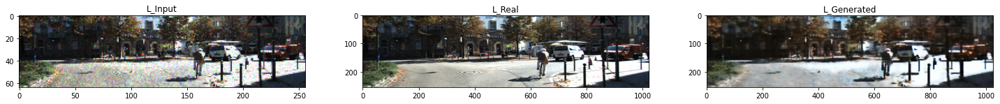

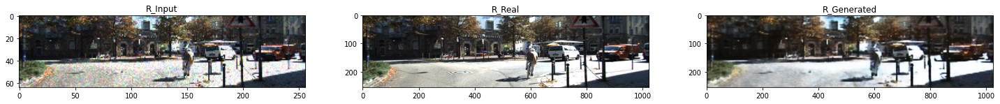

epoch 27  gan_loss: 2.8291327953338623  l1_loss: 13.742923736572266  disc_loss: 5.5214033126831055
-------- psnr:  141.96738    ----- epoch:  28
epoch 28  gan_loss: 2.7168846130371094  l1_loss: 16.428791046142578  disc_loss: 5.545469284057617
-------- psnr:  138.82176    ----- epoch:  29
epoch 29  gan_loss: 2.709195852279663  l1_loss: 18.002485275268555  disc_loss: 5.521256446838379
-------- psnr:  144.03906    ----- epoch:  30
epoch 30  gan_loss: 2.913921594619751  l1_loss: 11.398271560668945  disc_loss: 5.556458473205566
-------- psnr:  145.51723    ----- epoch:  31


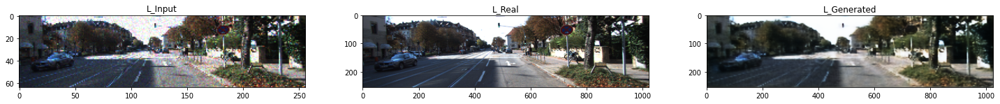

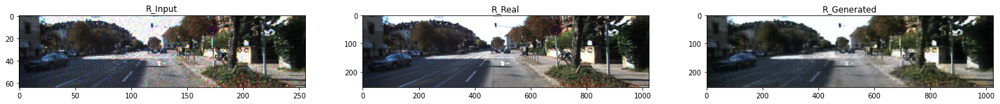

epoch 31  gan_loss: 2.793386936187744  l1_loss: 18.415420532226562  disc_loss: 5.5195817947387695
-------- psnr:  144.75784    ----- epoch:  32
epoch 32  gan_loss: 2.7180683612823486  l1_loss: 18.154598236083984  disc_loss: 5.52344274520874
-------- psnr:  142.32603    ----- epoch:  33
epoch 33  gan_loss: 2.7672247886657715  l1_loss: 13.87940502166748  disc_loss: 5.526336193084717
-------- psnr:  137.65855    ----- epoch:  34
epoch 34  gan_loss: 2.5607786178588867  l1_loss: 14.190903663635254  disc_loss: 5.571496486663818
-------- psnr:  145.66202    ----- epoch:  35


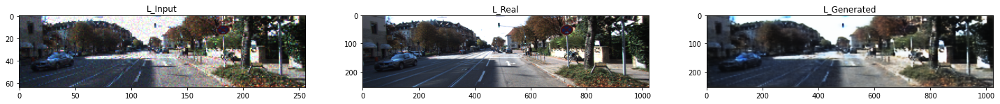

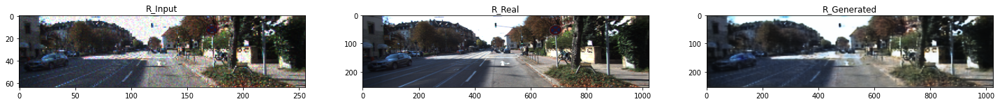

epoch 35  gan_loss: 2.7608065605163574  l1_loss: 16.341569900512695  disc_loss: 5.554399013519287
-------- psnr:  141.5141    ----- epoch:  36
epoch 36  gan_loss: 2.8862905502319336  l1_loss: 12.264287948608398  disc_loss: 5.548853874206543
-------- psnr:  137.61372    ----- epoch:  37
epoch 37  gan_loss: 2.8794479370117188  l1_loss: 16.064960479736328  disc_loss: 5.52404260635376
-------- psnr:  140.26207    ----- epoch:  38
epoch 38  gan_loss: 2.6934990882873535  l1_loss: 15.242086410522461  disc_loss: 5.520081520080566
-------- psnr:  146.10306    ----- epoch:  39


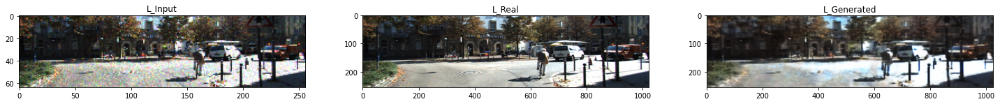

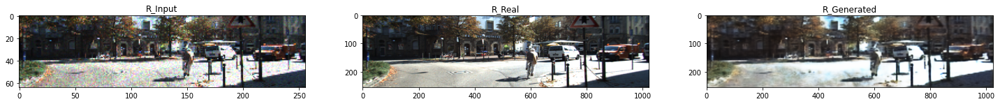

epoch 39  gan_loss: 2.756145715713501  l1_loss: 28.74648094177246  disc_loss: 5.479089260101318
-------- psnr:  133.96835    ----- epoch:  40
epoch 40  gan_loss: 2.6900863647460938  l1_loss: 15.683298110961914  disc_loss: 5.4951677322387695
-------- psnr:  144.38065    ----- epoch:  41
epoch 41  gan_loss: 2.6970179080963135  l1_loss: 14.06153678894043  disc_loss: 5.458219528198242
-------- psnr:  136.19649    ----- epoch:  42
epoch 42  gan_loss: 2.864521026611328  l1_loss: 14.825601577758789  disc_loss: 5.453592777252197
-------- psnr:  138.638    ----- epoch:  43
epoch 43  gan_loss: 2.8082542419433594  l1_loss: 11.652200698852539  disc_loss: 5.526165008544922
-------- psnr:  143.47351    ----- epoch:  44
epoch 44  gan_loss: 2.7760071754455566  l1_loss: 15.90362548828125  disc_loss: 5.558967590332031
-------- psnr:  142.5865    ----- epoch:  45
epoch 45  gan_loss: 2.8139829635620117  l1_loss: 13.549415588378906  disc_loss: 5.546380996704102
-------- psnr:  146.81166    ----- epoch:  46

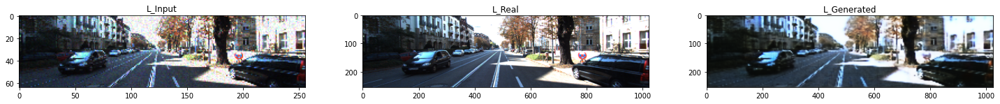

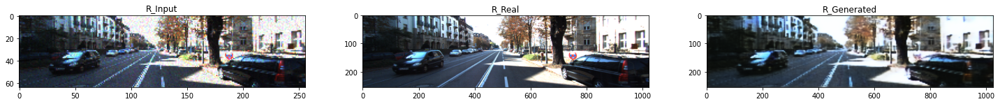

epoch 46  gan_loss: 2.5939738750457764  l1_loss: 14.11555290222168  disc_loss: 5.55207633972168
-------- psnr:  111.64336    ----- epoch:  47
epoch 47  gan_loss: 2.8034658432006836  l1_loss: 14.04119873046875  disc_loss: 5.950623989105225
-------- psnr:  143.43767    ----- epoch:  48
epoch 48  gan_loss: 2.867892265319824  l1_loss: 14.429863929748535  disc_loss: 5.579848766326904
-------- psnr:  144.56311    ----- epoch:  49
epoch 49  gan_loss: 2.7255940437316895  l1_loss: 11.719456672668457  disc_loss: 5.54868221282959
-------- psnr:  145.17006    ----- epoch:  50
epoch 50  gan_loss: 2.76698637008667  l1_loss: 11.338604927062988  disc_loss: 5.561068058013916
-------- psnr:  143.96703    ----- epoch:  51
epoch 51  gan_loss: 2.7886273860931396  l1_loss: 13.697616577148438  disc_loss: 5.524597644805908
-------- psnr:  143.1908    ----- epoch:  52
epoch 52  gan_loss: 2.797076463699341  l1_loss: 12.915891647338867  disc_loss: 5.529988765716553
-------- psnr:  143.89551    ----- epoch:  53
e

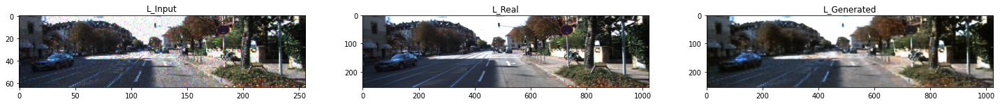

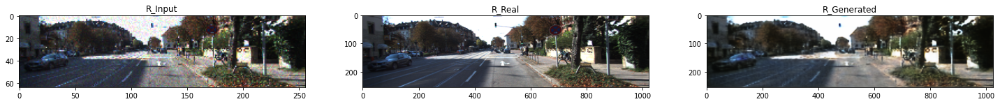

epoch 58  gan_loss: 2.7920472621917725  l1_loss: 9.826001167297363  disc_loss: 5.548023223876953
-------- psnr:  138.7059    ----- epoch:  59
epoch 59  gan_loss: 2.8202714920043945  l1_loss: 13.61796760559082  disc_loss: 5.518400192260742
-------- psnr:  143.85832    ----- epoch:  60
epoch 60  gan_loss: 2.821629047393799  l1_loss: 11.046562194824219  disc_loss: 5.5336456298828125
-------- psnr:  138.90158    ----- epoch:  61
epoch 61  gan_loss: 2.89313006401062  l1_loss: 12.079768180847168  disc_loss: 5.524984836578369
-------- psnr:  135.80466    ----- epoch:  62
epoch 62  gan_loss: 2.7526071071624756  l1_loss: 14.612834930419922  disc_loss: 5.549947261810303
-------- psnr:  143.95425    ----- epoch:  63
epoch 63  gan_loss: 2.800271511077881  l1_loss: 13.188546180725098  disc_loss: 5.54582405090332
-------- psnr:  142.4651    ----- epoch:  64
epoch 64  gan_loss: 2.83927059173584  l1_loss: 12.656362533569336  disc_loss: 5.555704116821289
-------- psnr:  145.90099    ----- epoch:  65
ep

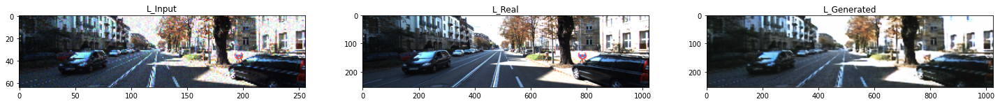

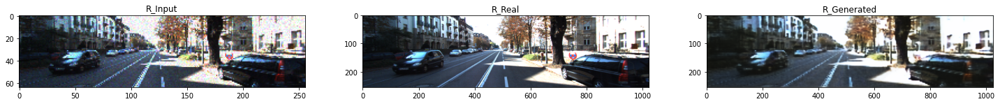

epoch 66  gan_loss: 2.782274007797241  l1_loss: 13.33098030090332  disc_loss: 5.518370151519775
-------- psnr:  141.63078    ----- epoch:  67
epoch 67  gan_loss: 2.8554558753967285  l1_loss: 11.79232120513916  disc_loss: 5.531102657318115
-------- psnr:  142.35413    ----- epoch:  68
epoch 68  gan_loss: 2.843925714492798  l1_loss: 10.627296447753906  disc_loss: 5.530682563781738
-------- psnr:  144.54315    ----- epoch:  69
epoch 69  gan_loss: 2.6765217781066895  l1_loss: 14.04806137084961  disc_loss: 5.536912441253662
-------- psnr:  146.65242    ----- epoch:  70
epoch 70  gan_loss: 2.8063573837280273  l1_loss: 13.960060119628906  disc_loss: 5.547077655792236
-------- psnr:  148.0977    ----- epoch:  71


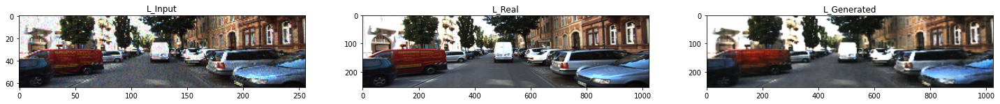

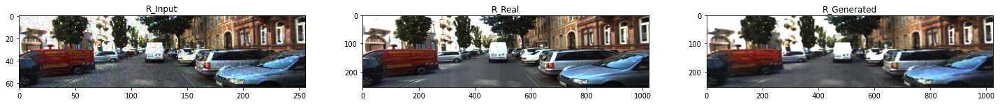

epoch 71  gan_loss: 2.853614330291748  l1_loss: 13.347593307495117  disc_loss: 5.542520046234131
-------- psnr:  147.67458    ----- epoch:  72
epoch 72  gan_loss: 2.7430591583251953  l1_loss: 13.916824340820312  disc_loss: 5.51137638092041
-------- psnr:  148.60245    ----- epoch:  73


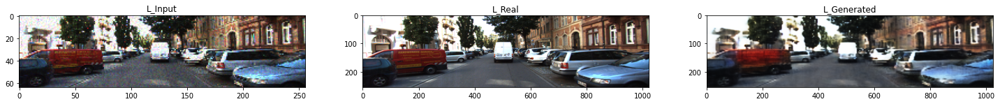

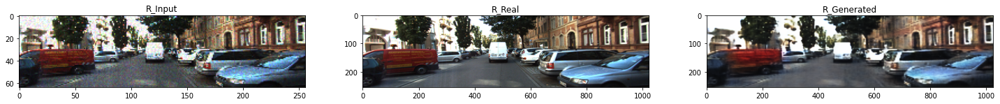

epoch 73  gan_loss: 2.78842830657959  l1_loss: 14.878637313842773  disc_loss: 5.543762683868408
-------- psnr:  142.72462    ----- epoch:  74
epoch 74  gan_loss: 2.745267868041992  l1_loss: 10.095809936523438  disc_loss: 5.524131774902344
-------- psnr:  72.987564    ----- epoch:  75
epoch 75  gan_loss: 2.815518856048584  l1_loss: 20.027502059936523  disc_loss: 5.5969672203063965
-------- psnr:  138.72745    ----- epoch:  76
epoch 76  gan_loss: 2.67535138130188  l1_loss: 14.475820541381836  disc_loss: 5.542553901672363
-------- psnr:  144.11313    ----- epoch:  77
epoch 77  gan_loss: 2.8827435970306396  l1_loss: 11.691519737243652  disc_loss: 5.558839797973633
-------- psnr:  140.57607    ----- epoch:  78
epoch 78  gan_loss: 2.7504189014434814  l1_loss: 14.55140495300293  disc_loss: 5.556339263916016
-------- psnr:  137.8764    ----- epoch:  79
epoch 79  gan_loss: 2.799868106842041  l1_loss: 13.773271560668945  disc_loss: 5.550647735595703
-------- psnr:  138.97882    ----- epoch:  80


-------- psnr:  148.72491    ----- epoch:  131


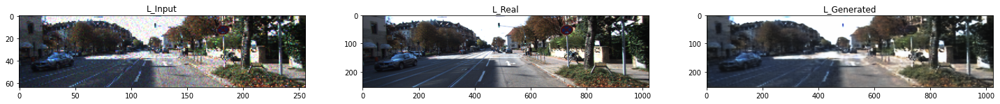

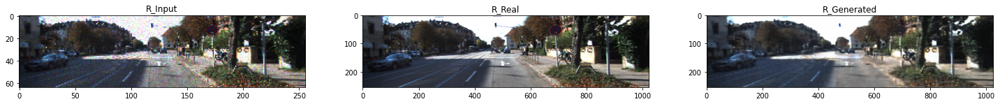

epoch 131  gan_loss: 3.029043436050415  l1_loss: 12.453407287597656  disc_loss: 5.437620162963867
-------- psnr:  147.80272    ----- epoch:  132
epoch 132  gan_loss: 2.820002794265747  l1_loss: 18.124034881591797  disc_loss: 5.279059410095215
-------- psnr:  145.69937    ----- epoch:  133
epoch 133  gan_loss: 2.839299440383911  l1_loss: 9.842039108276367  disc_loss: 5.468817234039307
-------- psnr:  146.72871    ----- epoch:  134
epoch 134  gan_loss: 2.682252883911133  l1_loss: 11.958230972290039  disc_loss: 5.314015865325928
-------- psnr:  142.17545    ----- epoch:  135
epoch 135  gan_loss: 3.6180105209350586  l1_loss: 12.916085243225098  disc_loss: 5.2943830490112305
-------- psnr:  140.46927    ----- epoch:  136
epoch 136  gan_loss: 2.64500093460083  l1_loss: 11.220412254333496  disc_loss: 5.483702182769775
-------- psnr:  144.08879    ----- epoch:  137
epoch 137  gan_loss: 2.8364949226379395  l1_loss: 12.941911697387695  disc_loss: 5.422406196594238
-------- psnr:  143.84894    --

In [22]:
        
EPOCHS = 151
fit(train_dataset, EPOCHS, test_dataset)

### Show

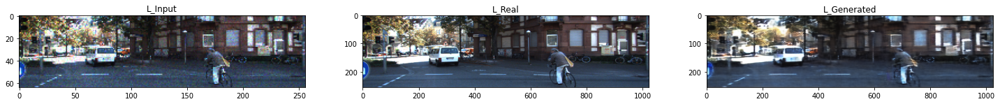

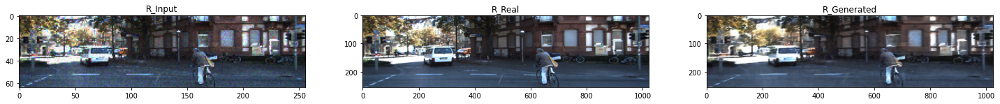

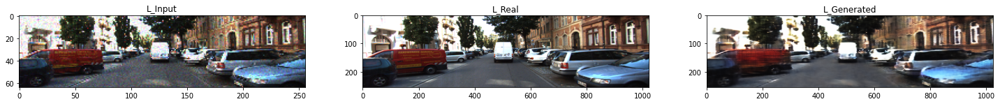

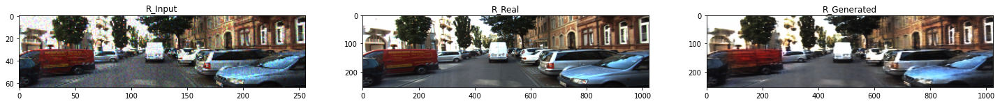

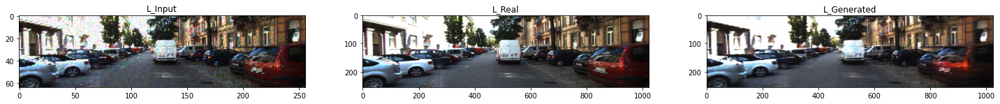

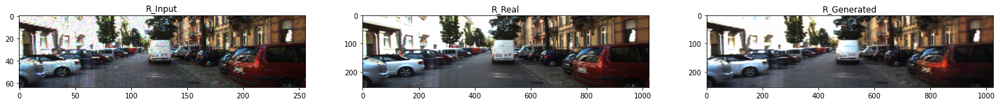

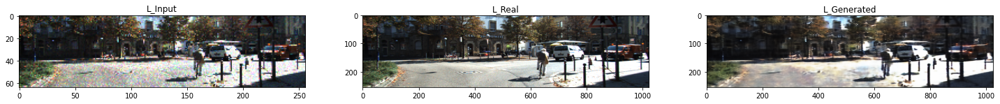

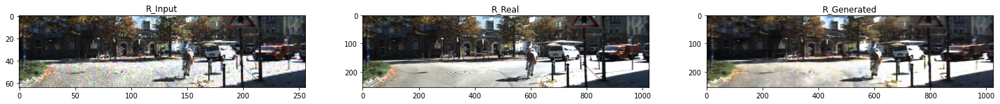

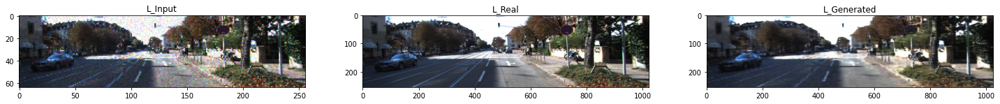

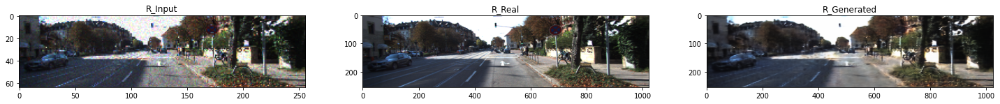

In [23]:
for left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr in test_dataset.take(5):
                generate_images(generator, left_image_lr, right_image_lr, left_target_lr, right_target_lr, left_target_hr, right_target_hr)